# Install packages 

In [1]:
library(tidyverse)
library(readr)
library(ggplot2)
library(lubridate)
library(readxl)
library(knitr)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.0     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.1     ✔ tibble    3.1.8
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.1     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


# Databases

**Types of databases**
* MySQL
* PostgreSQL
* Redshift 
* SQLite 


**Library**

In [2]:
library(RSQLite)

**Open up connection**

In [3]:
con <- RSQLite::dbConnect(drv    = SQLite(), 
                          dbname = "/kaggle/input/bike-training-dataset/ds_data/ds_data/02_chinook/Chinook_Sqlite.sqlite")
con

<SQLiteConnection>
  Path: /kaggle/input/bike-training-dataset/ds_data/ds_data/02_chinook/Chinook_Sqlite.sqlite
  Extensions: TRUE

**See the table variables**

In [4]:
dbListTables(con)

[1] "Album"         "Artist"        "Customer"      "Employee"     
 [5] "Genre"         "Invoice"       "InvoiceLine"   "MediaType"    
 [9] "Playlist"      "PlaylistTrack" "Track"

In [5]:
tbl(con, "Artist")
tbl(con, "MediaType")
tbl(con, "Album")

# Source:   table<Artist> [?? x 2]
# Database: sqlite 3.40.1 [/kaggle/input/bike-training-dataset/ds_data/ds_data/02_chinook/Chinook_Sqlite.sqlite]
   ArtistId Name                
      <int> <chr>               
 1        1 AC/DC               
 2        2 Accept              
 3        3 Aerosmith           
 4        4 Alanis Morissette   
 5        5 Alice In Chains     
 6        6 Antônio Carlos Jobim
 7        7 Apocalyptica        
 8        8 Audioslave          
 9        9 BackBeat            
10       10 Billy Cobham        
# … with more rows

# Source:   table<MediaType> [5 x 2]
# Database: sqlite 3.40.1 [/kaggle/input/bike-training-dataset/ds_data/ds_data/02_chinook/Chinook_Sqlite.sqlite]
  MediaTypeId Name                       
        <int> <chr>                      
1           1 MPEG audio file            
2           2 Protected AAC audio file   
3           3 Protected MPEG-4 video file
4           4 Purchased AAC audio file   
5           5 AAC audio file             

# Source:   table<Album> [?? x 3]
# Database: sqlite 3.40.1 [/kaggle/input/bike-training-dataset/ds_data/ds_data/02_chinook/Chinook_Sqlite.sqlite]
   AlbumId Title                                 ArtistId
     <int> <chr>                                    <int>
 1       1 For Those About To Rock We Salute You        1
 2       2 Balls to the Wall                            2
 3       3 Restless and Wild                            2
 4       4 Let There Be Rock                            1
 5       5 Big Ones                                     3
 6       6 Jagged Little Pill                           4
 7       7 Facelift                                     5
 8       8 Warner 25 Anos                               6
 9       9 Plays Metallica By Four Cellos               7
10      10 Audioslave                                   8
# … with more rows

**Pull data into local memory / instance**

In [6]:
album_tbl = tbl(con, "Album") %>% collect()
album_tbl

AlbumId,Title,ArtistId
<int>,<chr>,<int>
1,For Those About To Rock We Salute You,1
2,Balls to the Wall,2
3,Restless and Wild,2
4,Let There Be Rock,1
5,Big Ones,3
6,Jagged Little Pill,4
7,Facelift,5
8,Warner 25 Anos,6
9,Plays Metallica By Four Cellos,7


**Sending queries example**

In [7]:
x <- dbGetQuery(con, 'SELECT * FROM Artist')
x

ArtistId,Name
<int>,<chr>
1,AC/DC
2,Accept
3,Aerosmith
4,Alanis Morissette
5,Alice In Chains
6,Antônio Carlos Jobim
7,Apocalyptica
8,Audioslave
9,BackBeat


**Disconnect from database**

In [8]:
dbDisconnect(con)
con

<SQLiteConnection>
  DISCONNECTED

# API

**Requests**
* GET: request data from specified resource
* POST: send data to a server to create/update a resource
* https://swapi.dev/api/ example to be used 


* operation - scheme - host - basePath - path / endpoint - query parameter
* GET - https:// - swapi.dev/ - api/ - people/ - ?page=2
* GET https://swapi.dev/api/people/?page=2

**Glue / Gluing string interpolation**

In [9]:
library(glue)

In [10]:
name = "Someone"
glue("My name is {name}")


My name is Someone

**Get function**
* status: 200 means success
* status: 403 means no access permission
* status: 404 means not found

In [11]:
library(httr)

* swapi.dev is down, therefore using pokeapi

In [12]:
#resp = GET("https://swapi.dev/api/people/1/")

## Wrapped into a function
#sw_api <- function(path) {
#  url <- modify_url(url = "https://swapi.dev", path = glue("/api{path}"))
#  resp <- GET(url)
#   stop_for_status(resp) # automatically throws an error if a request did not succeed
#}

#resp <- sw_api("/people/1")
#resp

* API response

In [13]:
resp = GET("https://pokeapi.co/api/v2/pokemon/bulbasaur")

# Wrapped into a function
sw_api <- function(path) {
  url <- modify_url(url = "https://pokeapi.co", path = glue("/api{path}"))
  resp <- GET(url)
  #stop_for_status(resp) # automatically throws an error if a request did not succeed
}

resp <- sw_api("/v2/pokemon/bulbasaur")
resp

Response [https://pokeapi.co/api/v2/pokemon/bulbasaur]
  Date: 2023-05-21 09:32
  Status: 200
  Content-Type: application/json; charset=utf-8
  Size: 220 kB


**Convert raw data to characters**

In [14]:
rawToChar(resp$content)

[1] "{\"abilities\":[{\"ability\":{\"name\":\"overgrow\",\"url\":\"https://pokeapi.co/api/v2/ability/65/\"},\"is_hidden\":false,\"slot\":1},{\"ability\":{\"name\":\"chlorophyll\",\"url\":\"https://pokeapi.co/api/v2/ability/34/\"},\"is_hidden\":true,\"slot\":3}],\"base_experience\":64,\"forms\":[{\"name\":\"bulbasaur\",\"url\":\"https://pokeapi.co/api/v2/pokemon-form/1/\"}],\"game_indices\":[{\"game_index\":153,\"version\":{\"name\":\"red\",\"url\":\"https://pokeapi.co/api/v2/version/1/\"}},{\"game_index\":153,\"version\":{\"name\":\"blue\",\"url\":\"https://pokeapi.co/api/v2/version/2/\"}},{\"game_index\":153,\"version\":{\"name\":\"yellow\",\"url\":\"https://pokeapi.co/api/v2/version/3/\"}},{\"game_index\":1,\"version\":{\"name\":\"gold\",\"url\":\"https://pokeapi.co/api/v2/version/4/\"}},{\"game_index\":1,\"version\":{\"name\":\"silver\",\"url\":\"https://pokeapi.co/api/v2/version/5/\"}},{\"game_index\":1,\"version\":{\"name\":\"crystal\",\"url\":\"https://pokeapi.co/api/v2/version/6/\"}},{\"game_index\":1,\"version\":{\"name\":\"ruby\",\"url\":\"https://pokeapi.co/api/v2/version/7/\"}},{\"game_index\":1,\"version\":{\"name\":\"sapphire\",\"url\":\"https://pokeapi.co/api/v2/version/8/\"}},{\"game_index\":1,\"version\":{\"name\":\"emerald\",\"url\":\"https://pokeapi.co/api/v2/version/9/\"}},{\"game_index\":1,\"version\":{\"name\":\"firered\",\"url\":\"https://pokeapi.co/api/v2/version/10/\"}},{\"game_index\":1,\"version\":{\"name\":\"leafgreen\",\"url\":\"https://pokeapi.co/api/v2/version/11/\"}},{\"game_index\":1,\"version\":{\"name\":\"diamond\",\"url\":\"https://pokeapi.co/api/v2/version/12/\"}},{\"game_index\":1,\"version\":{\"name\":\"pearl\",\"url\":\"https://pokeapi.co/api/v2/version/13/\"}},{\"game_index\":1,\"version\":{\"name\":\"platinum\",\"url\":\"https://pokeapi.co/api/v2/version/14/\"}},{\"game_index\":1,\"version\":{\"name\":\"heartgold\",\"url\":\"https://pokeapi.co/api/v2/version/15/\"}},{\"game_index\":1,\"version\":{\"name\":\"soulsilver\",\"url\":\"https://pokeapi.co/api/v2/version/16/\"}},{\"game_index\":1,\"version\":{\"name\":\"black\",\"url\":\"https://pokeapi.co/api/v2/version/17/\"}},{\"game_index\":1,\"version\":{\"name\":\"white\",\"url\":\"https://pokeapi.co/api/v2/version/18/\"}},{\"game_index\":1,\"version\":{\"name\":\"black-2\",\"url\":\"https://pokeapi.co/api/v2/version/21/\"}},{\"game_index\":1,\"version\":{\"name\":\"white-2\",\"url\":\"https://pokeapi.co/api/v2/version/22/\"}}],\"height\":7,\"held_items\":[],\"id\":1,\"is_default\":true,\"location_area_encounters\":\"https://pokeapi.co/api/v2/pokemon/1/encounters\",\"moves\":[{\"move\":{\"name\":\"razor-wind\",\"url\":\"https://pokeapi.co/api/v2/move/13/\"},\"version_group_details\":[{\"level_learned_at\":0,\"move_learn_method\":{\"name\":\"egg\",\"url\":\"https://pokeapi.co/api/v2/move-learn-method/2/\"},\"version_group\":{\"name\":\"gold-silver\",\"url\":\"https://pokeapi.co/api/v2/version-group/3/\"}},{\"level_learned_at\":0,\"move_learn_method\":{\"name\":\"egg\",\"url\":\"https://pokeapi.co/api/v2/move-learn-method/2/\"},\"version_group\":{\"name\":\"crystal\",\"url\":\"https://pokeapi.co/api/v2/version-group/4/\"}}]},{\"move\":{\"name\":\"swords-dance\",\"url\":\"https://pokeapi.co/api/v2/move/14/\"},\"version_group_details\":[{\"level_learned_at\":0,\"move_learn_method\":{\"name\":\"machine\",\"url\":\"https://pokeapi.co/api/v2/move-learn-method/4/\"},\"version_group\":{\"name\":\"red-blue\",\"url\":\"https://pokeapi.co/api/v2/version-group/1/\"}},{\"level_learned_at\":0,\"move_learn_method\":{\"name\":\"machine\",\"url\":\"https://pokeapi.co/api/v2/move-learn-method/4/\"},\"version_group\":{\"name\":\"yellow\",\"url\":\"https://pokeapi.co/api/v2/version-group/2/\"}},{\"level_learned_at\":0,\"move_learn_method\":{\"name\":\"tutor\",\"url\":\"https://pokeapi.co/api/v2/move-learn-method/3/\"},\"version_group\":{\"name\":\"emerald\",\"url\":\"https://pokeapi.co/api/v2/version-group/6/\"}},{\"level_learned_at\":0,\"move_learn_method\":

**R Lists**
* In regular R list, fetching data inside an array is by using [ ]

In [15]:
data_list <- list(strings= c("string1", "string2"), 
                  numbers = c(1,2,3), 
                  TRUE, 
                  100.23, 
                  tibble(
                      A = c(1,2), 
                      B = c("x", "y")
                    )
                  )
data_list
data_list[3]

A,B
<dbl>,<chr>
1,x
2,y


[[1]]
[1] TRUE

**Fetching certain data**
* using [[ or $


In [16]:
library(jsonlite)
resp %>% 
    .$content %>% 
    rawToChar() %>% 
    jsonlite::fromJSON()


Attaching package: ‘jsonlite’


The following object is masked from ‘package:purrr’:

    flatten


ERROR while rich displaying an object: Error in names(parts) <- colnames(x): 'names' attribute [3] must be the same length as the vector [2]

Traceback:
1. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
2. tryCatchList(expr, classes, parentenv, handlers)
3. tryCatchOne(expr, names, parentenv, handlers[[1L]])
4. doTryCatch(return(expr), name, parentenv, handler)
5. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     p

$abilities
  ability.name                           ability.url is_hidden slot
1     overgrow https://pokeapi.co/api/v2/ability/65/     FALSE    1
2  chlorophyll https://pokeapi.co/api/v2/ability/34/      TRUE    3

$base_experience
[1] 64

$forms
       name                                       url
1 bulbasaur https://pokeapi.co/api/v2/pokemon-form/1/

$game_indices
   game_index version.name                           version.url
1         153          red  https://pokeapi.co/api/v2/version/1/
2         153         blue  https://pokeapi.co/api/v2/version/2/
3         153       yellow  https://pokeapi.co/api/v2/version/3/
4           1         gold  https://pokeapi.co/api/v2/version/4/
5           1       silver  https://pokeapi.co/api/v2/version/5/
6           1      crystal  https://pokeapi.co/api/v2/version/6/
7           1         ruby  https://pokeapi.co/api/v2/version/7/
8           1     sapphire  https://pokeapi.co/api/v2/version/8/
9           1      emerald  https://pokeapi.

* Accessing content of API response

**Access body as a character vector**

In [17]:
content(resp, as = "text")

[1] "{\"abilities\":[{\"ability\":{\"name\":\"overgrow\",\"url\":\"https://pokeapi.co/api/v2/ability/65/\"},\"is_hidden\":false,\"slot\":1},{\"ability\":{\"name\":\"chlorophyll\",\"url\":\"https://pokeapi.co/api/v2/ability/34/\"},\"is_hidden\":true,\"slot\":3}],\"base_experience\":64,\"forms\":[{\"name\":\"bulbasaur\",\"url\":\"https://pokeapi.co/api/v2/pokemon-form/1/\"}],\"game_indices\":[{\"game_index\":153,\"version\":{\"name\":\"red\",\"url\":\"https://pokeapi.co/api/v2/version/1/\"}},{\"game_index\":153,\"version\":{\"name\":\"blue\",\"url\":\"https://pokeapi.co/api/v2/version/2/\"}},{\"game_index\":153,\"version\":{\"name\":\"yellow\",\"url\":\"https://pokeapi.co/api/v2/version/3/\"}},{\"game_index\":1,\"version\":{\"name\":\"gold\",\"url\":\"https://pokeapi.co/api/v2/version/4/\"}},{\"game_index\":1,\"version\":{\"name\":\"silver\",\"url\":\"https://pokeapi.co/api/v2/version/5/\"}},{\"game_index\":1,\"version\":{\"name\":\"crystal\",\"url\":\"https://pokeapi.co/api/v2/version/6/\"}},{\"game_index\":1,\"version\":{\"name\":\"ruby\",\"url\":\"https://pokeapi.co/api/v2/version/7/\"}},{\"game_index\":1,\"version\":{\"name\":\"sapphire\",\"url\":\"https://pokeapi.co/api/v2/version/8/\"}},{\"game_index\":1,\"version\":{\"name\":\"emerald\",\"url\":\"https://pokeapi.co/api/v2/version/9/\"}},{\"game_index\":1,\"version\":{\"name\":\"firered\",\"url\":\"https://pokeapi.co/api/v2/version/10/\"}},{\"game_index\":1,\"version\":{\"name\":\"leafgreen\",\"url\":\"https://pokeapi.co/api/v2/version/11/\"}},{\"game_index\":1,\"version\":{\"name\":\"diamond\",\"url\":\"https://pokeapi.co/api/v2/version/12/\"}},{\"game_index\":1,\"version\":{\"name\":\"pearl\",\"url\":\"https://pokeapi.co/api/v2/version/13/\"}},{\"game_index\":1,\"version\":{\"name\":\"platinum\",\"url\":\"https://pokeapi.co/api/v2/version/14/\"}},{\"game_index\":1,\"version\":{\"name\":\"heartgold\",\"url\":\"https://pokeapi.co/api/v2/version/15/\"}},{\"game_index\":1,\"version\":{\"name\":\"soulsilver\",\"url\":\"https://pokeapi.co/api/v2/version/16/\"}},{\"game_index\":1,\"version\":{\"name\":\"black\",\"url\":\"https://pokeapi.co/api/v2/version/17/\"}},{\"game_index\":1,\"version\":{\"name\":\"white\",\"url\":\"https://pokeapi.co/api/v2/version/18/\"}},{\"game_index\":1,\"version\":{\"name\":\"black-2\",\"url\":\"https://pokeapi.co/api/v2/version/21/\"}},{\"game_index\":1,\"version\":{\"name\":\"white-2\",\"url\":\"https://pokeapi.co/api/v2/version/22/\"}}],\"height\":7,\"held_items\":[],\"id\":1,\"is_default\":true,\"location_area_encounters\":\"https://pokeapi.co/api/v2/pokemon/1/encounters\",\"moves\":[{\"move\":{\"name\":\"razor-wind\",\"url\":\"https://pokeapi.co/api/v2/move/13/\"},\"version_group_details\":[{\"level_learned_at\":0,\"move_learn_method\":{\"name\":\"egg\",\"url\":\"https://pokeapi.co/api/v2/move-learn-method/2/\"},\"version_group\":{\"name\":\"gold-silver\",\"url\":\"https://pokeapi.co/api/v2/version-group/3/\"}},{\"level_learned_at\":0,\"move_learn_method\":{\"name\":\"egg\",\"url\":\"https://pokeapi.co/api/v2/move-learn-method/2/\"},\"version_group\":{\"name\":\"crystal\",\"url\":\"https://pokeapi.co/api/v2/version-group/4/\"}}]},{\"move\":{\"name\":\"swords-dance\",\"url\":\"https://pokeapi.co/api/v2/move/14/\"},\"version_group_details\":[{\"level_learned_at\":0,\"move_learn_method\":{\"name\":\"machine\",\"url\":\"https://pokeapi.co/api/v2/move-learn-method/4/\"},\"version_group\":{\"name\":\"red-blue\",\"url\":\"https://pokeapi.co/api/v2/version-group/1/\"}},{\"level_learned_at\":0,\"move_learn_method\":{\"name\":\"machine\",\"url\":\"https://pokeapi.co/api/v2/move-learn-method/4/\"},\"version_group\":{\"name\":\"yellow\",\"url\":\"https://pokeapi.co/api/v2/version-group/2/\"}},{\"level_learned_at\":0,\"move_learn_method\":{\"name\":\"tutor\",\"url\":\"https://pokeapi.co/api/v2/move-learn-method/3/\"},\"version_group\":{\"name\":\"emerald\",\"url\":\"https://pokeapi.co/api/v2/version-group/6/\"}},{\"level_learned_at\":0,\"move_learn_method\":

**Access body and parsed into a list**

In [18]:
content(resp, as = "parsed")

$abilities
$abilities[[1]]
$abilities[[1]]$ability
$abilities[[1]]$ability$name
[1] "overgrow"

$abilities[[1]]$ability$url
[1] "https://pokeapi.co/api/v2/ability/65/"


$abilities[[1]]$is_hidden
[1] FALSE

$abilities[[1]]$slot
[1] 1


$abilities[[2]]
$abilities[[2]]$ability
$abilities[[2]]$ability$name
[1] "chlorophyll"

$abilities[[2]]$ability$url
[1] "https://pokeapi.co/api/v2/ability/34/"


$abilities[[2]]$is_hidden
[1] TRUE

$abilities[[2]]$slot
[1] 3



$base_experience
[1] 64

$forms
$forms[[1]]
$forms[[1]]$name
[1] "bulbasaur"

$forms[[1]]$url
[1] "https://pokeapi.co/api/v2/pokemon-form/1/"



$game_indices
$game_indices[[1]]
$game_indices[[1]]$game_index
[1] 153

$game_indices[[1]]$version
$game_indices[[1]]$version$name
[1] "red"

$game_indices[[1]]$version$url
[1] "https://pokeapi.co/api/v2/version/1/"



$game_indices[[2]]
$game_indices[[2]]$game_index
[1] 153

$game_indices[[2]]$version
$game_indices[[2]]$version$name
[1] "blue"

$game_indices[[2]]$version$url
[1] "https://pokeapi.co/api/v2/version/2/"



$game_indices[[3]]
$game_indices[[3]]$game_index
[1] 153

$game_indices[[3]]$version
$game_indices[[3]]$version$name
[1] "yellow"

$game_indices[[3]]$version$url
[1] "https://pokeapi.co/api/v2/version/3/"



$game_indices[[4]]
$game_indices[[4]]$game_index
[1] 1

$game_indices[[4]]$version
$game_indices[[4]]$version$name
[1] "gold"

$game_indices[[4]]$version$url
[1] "https://pokeapi.co/api/v2/version/4/"



$game_indices[[5]]
$game_indices[[5]]$game_index
[1] 1

$game_indices[[5]]$version
$game_indices[[5]]$version$name
[1] "silver"

$game_indices[[5]]$version$url
[1] "https://pokeapi.co/api/v2/version/5/"



$game_indices[[6]]
$game_indices[[6]]$game_index
[1] 1

$game_indices[[6]]$version
$game_indices[[6]]$version$name
[1] "crystal"

$game_indices[[6]]$version$url
[1] "https://pokeapi.co/api/v2/version/6/"



$game_indices[[7]]
$game_indices[[7]]$game_index
[1] 1

$game_indices[[7]]$version
$game_indices[[7]]$version$name
[1] "ruby"

$game_indices[[7]]$version$url
[1] "https://pokeapi.co/api/v2/version/7/"



$game_indices[[8]]
$game_indices[[8]]$game_index
[1] 1

$game_indices[[8]]$version
$game_indices[[8]]$version$name
[1] "sapphire"

$game_indices[[8]]$version$url
[1] "https://pokeapi.co/api/v2/version/8/"



$game_indices[[9]]
$game_indices[[9]]$game_index
[1] 1

$game_indices[[9]]$version
$game_indices[[9]]$version$name
[1] "emerald"

$game_indices[[9]]$version$url
[1] "https://pokeapi.co/api/v2/version/9/"



$game_indices[[10]]
$game_indices[[10]]$game_index
[1] 1

$game_indices[[10]]$version
$game_indices[[10]]$version$name
[1] "firered"

$game_indices[[10]]$version$url
[1] "https://pokeapi.co/api/v2/version/10/"



$game_indices[[11]]
$game_indices[[11]]$game_index
[1] 1

$game_indices[[11]]$version
$game_indices[[11]]$version$name
[1] "leafgreen"

$game_indices[[11]]$version$url
[1] "https://pokeapi.co/api/v2/version/11/"



$game_indices[[12]]
$game_indices[[12]]$game_index
[1] 1

$game_indices[[12]]$version
$game_indices[[12]]$version$name
[1] "diamond"

$game_indices[[12]]$version$url
[1] "https://pokeapi.co/api/v2/version/12/"



$game_indices[[13]]
$game_indices[[13]]$game_index
[1] 1

$game_indices[[13]]$version
$game_indices[[13]]$version$name
[1] "pearl"

$game_indices[[13]]$version$url
[1] "https://pokeapi.co/api/v2/version/13/"



$game_indices[[14]]
$game_indices[[14]]$game_index
[1] 1

$game_indices[[14]]$version
$game_indices[[14]]$version$name
[1] "platinum"

$game_indices[[14]]$version$url
[1] "https://pokeapi.co/api/v2/version/14/"



$game_indices[[15]]
$game_indices[[15]]$game_index
[1] 1

$game_indices[[15]]$version
$game_indices[[15]]$version$name
[1] "heartgold"

$game_indices[[15]]$version$url
[1] "https://pokeapi.co/api/v2/version/15/"



$game_indices[[16]]
$game_indices[[16]]$game_index
[1] 1

$game_indices[[16]]$version
$game_indices[[16]]$version$name
[1] "soulsilver"

$game_indices[[16]]$version$url
[1] "https://pokeapi.co/api/v2/version/16/"



$game_indices[[17]]
$game

* Default is "parsed"

In [19]:
content(resp)

$abilities
$abilities[[1]]
$abilities[[1]]$ability
$abilities[[1]]$ability$name
[1] "overgrow"

$abilities[[1]]$ability$url
[1] "https://pokeapi.co/api/v2/ability/65/"


$abilities[[1]]$is_hidden
[1] FALSE

$abilities[[1]]$slot
[1] 1


$abilities[[2]]
$abilities[[2]]$ability
$abilities[[2]]$ability$name
[1] "chlorophyll"

$abilities[[2]]$ability$url
[1] "https://pokeapi.co/api/v2/ability/34/"


$abilities[[2]]$is_hidden
[1] TRUE

$abilities[[2]]$slot
[1] 3



$base_experience
[1] 64

$forms
$forms[[1]]
$forms[[1]]$name
[1] "bulbasaur"

$forms[[1]]$url
[1] "https://pokeapi.co/api/v2/pokemon-form/1/"



$game_indices
$game_indices[[1]]
$game_indices[[1]]$game_index
[1] 153

$game_indices[[1]]$version
$game_indices[[1]]$version$name
[1] "red"

$game_indices[[1]]$version$url
[1] "https://pokeapi.co/api/v2/version/1/"



$game_indices[[2]]
$game_indices[[2]]$game_index
[1] 153

$game_indices[[2]]$version
$game_indices[[2]]$version$name
[1] "blue"

$game_indices[[2]]$version$url
[1] "https://pokeapi.co/api/v2/version/2/"



$game_indices[[3]]
$game_indices[[3]]$game_index
[1] 153

$game_indices[[3]]$version
$game_indices[[3]]$version$name
[1] "yellow"

$game_indices[[3]]$version$url
[1] "https://pokeapi.co/api/v2/version/3/"



$game_indices[[4]]
$game_indices[[4]]$game_index
[1] 1

$game_indices[[4]]$version
$game_indices[[4]]$version$name
[1] "gold"

$game_indices[[4]]$version$url
[1] "https://pokeapi.co/api/v2/version/4/"



$game_indices[[5]]
$game_indices[[5]]$game_index
[1] 1

$game_indices[[5]]$version
$game_indices[[5]]$version$name
[1] "silver"

$game_indices[[5]]$version$url
[1] "https://pokeapi.co/api/v2/version/5/"



$game_indices[[6]]
$game_indices[[6]]$game_index
[1] 1

$game_indices[[6]]$version
$game_indices[[6]]$version$name
[1] "crystal"

$game_indices[[6]]$version$url
[1] "https://pokeapi.co/api/v2/version/6/"



$game_indices[[7]]
$game_indices[[7]]$game_index
[1] 1

$game_indices[[7]]$version
$game_indices[[7]]$version$name
[1] "ruby"

$game_indices[[7]]$version$url
[1] "https://pokeapi.co/api/v2/version/7/"



$game_indices[[8]]
$game_indices[[8]]$game_index
[1] 1

$game_indices[[8]]$version
$game_indices[[8]]$version$name
[1] "sapphire"

$game_indices[[8]]$version$url
[1] "https://pokeapi.co/api/v2/version/8/"



$game_indices[[9]]
$game_indices[[9]]$game_index
[1] 1

$game_indices[[9]]$version
$game_indices[[9]]$version$name
[1] "emerald"

$game_indices[[9]]$version$url
[1] "https://pokeapi.co/api/v2/version/9/"



$game_indices[[10]]
$game_indices[[10]]$game_index
[1] 1

$game_indices[[10]]$version
$game_indices[[10]]$version$name
[1] "firered"

$game_indices[[10]]$version$url
[1] "https://pokeapi.co/api/v2/version/10/"



$game_indices[[11]]
$game_indices[[11]]$game_index
[1] 1

$game_indices[[11]]$version
$game_indices[[11]]$version$name
[1] "leafgreen"

$game_indices[[11]]$version$url
[1] "https://pokeapi.co/api/v2/version/11/"



$game_indices[[12]]
$game_indices[[12]]$game_index
[1] 1

$game_indices[[12]]$version
$game_indices[[12]]$version$name
[1] "diamond"

$game_indices[[12]]$version$url
[1] "https://pokeapi.co/api/v2/version/12/"



$game_indices[[13]]
$game_indices[[13]]$game_index
[1] 1

$game_indices[[13]]$version
$game_indices[[13]]$version$name
[1] "pearl"

$game_indices[[13]]$version$url
[1] "https://pokeapi.co/api/v2/version/13/"



$game_indices[[14]]
$game_indices[[14]]$game_index
[1] 1

$game_indices[[14]]$version
$game_indices[[14]]$version$name
[1] "platinum"

$game_indices[[14]]$version$url
[1] "https://pokeapi.co/api/v2/version/14/"



$game_indices[[15]]
$game_indices[[15]]$game_index
[1] 1

$game_indices[[15]]$version
$game_indices[[15]]$version$name
[1] "heartgold"

$game_indices[[15]]$version$url
[1] "https://pokeapi.co/api/v2/version/15/"



$game_indices[[16]]
$game_indices[[16]]$game_index
[1] 1

$game_indices[[16]]$version
$game_indices[[16]]$version$name
[1] "soulsilver"

$game_indices[[16]]$version$url
[1] "https://pokeapi.co/api/v2/version/16/"



$game_indices[[17]]
$game

# Query the API from alphvantage, to get stock of WIRECARD (Ticker WDI.DE)

* Get quote from a certain company, replace the symbol= with another stock ticker (IBM, WDI.DE, NKE, etc.) (IBM, wirecard, nike)
* If API requires authentication: apply tokens
* R packages of popular web API
    * spotifyr, rtweet, quandlr, Rfacebook, googleflights, ìnstaR, Rlinkedin, RedditExtractoR

In [20]:
resp <- GET('https://www.alphavantage.co/query?function=GLOBAL_QUOTE&symbol=WDI.DE')
resp

Response [https://www.alphavantage.co/query?function=GLOBAL_QUOTE&symbol=WDI.DE]
  Date: 2023-05-21 09:33
  Status: 200
  Content-Type: application/json
  Size: 189 B
{
    "Error Message": "the parameter apikey is invalid or missing. Please clai...

In [21]:
token    <- "my_individual_token"
response <- GET(glue("https://www.alphavantage.co/query?function=GLOBAL_QUOTE&symbol=WDI.DE&apikey={token}"))
response

Response [https://www.alphavantage.co/query?function=GLOBAL_QUOTE&symbol=WDI.DE&apikey=my_individual_token]
  Date: 2023-05-21 09:33
  Status: 200
  Content-Type: application/json
  Size: 377 B
{
    "Global Quote": {
        "01. symbol": "WDI.DE",
        "02. open": "0.4021",
        "03. high": "0.4099",
        "04. low": "0.3961",
        "05. price": "0.3985",
        "06. volume": "210849",
        "07. latest trading day": "2021-03-01",
        "08. previous close": "0.4109",
...

**Credentials security**
* .Renviron file
* Credential encryption (keyring package)
* RStuido IDE prompt

# FOR NOW IT IS SKIPPED, REFER TO THE startupengineer.io tutorial

# Web Scraping
* Not all website provides APIs to retrieve data
* Web scraping is therefore needed
* webpages has the general structure: HTML, XML, JSON 
* Languages used to create webpages: HTML (web structure), CSS (style), Javascript (functions). 


Example of DOM of HTML tree:

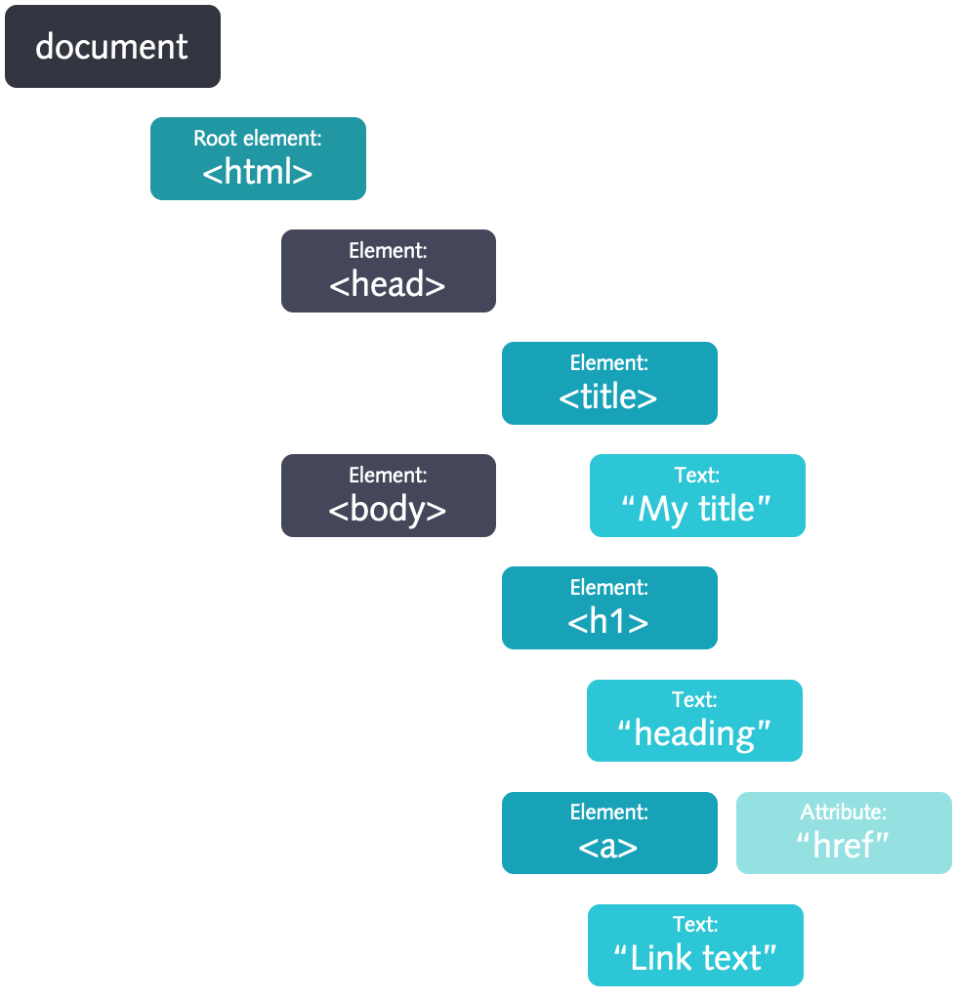

**Classes / information section of same type (images, name of product, price)**

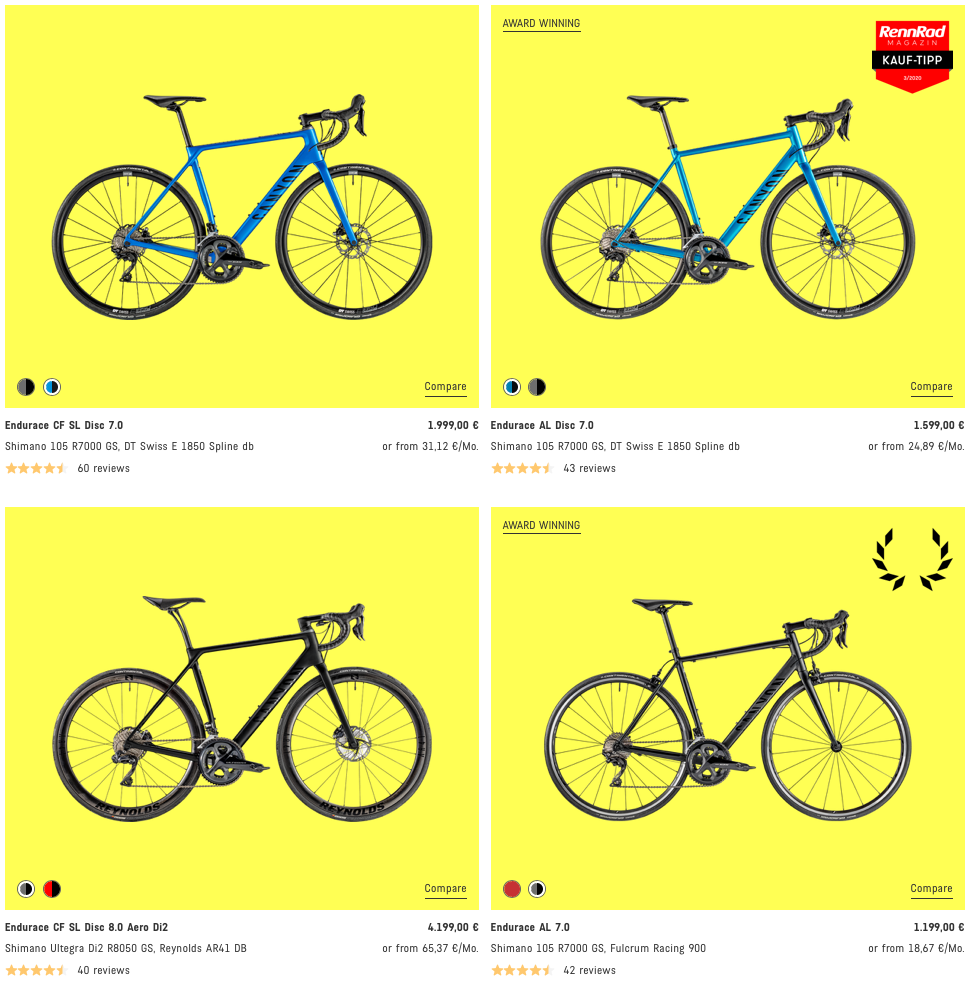

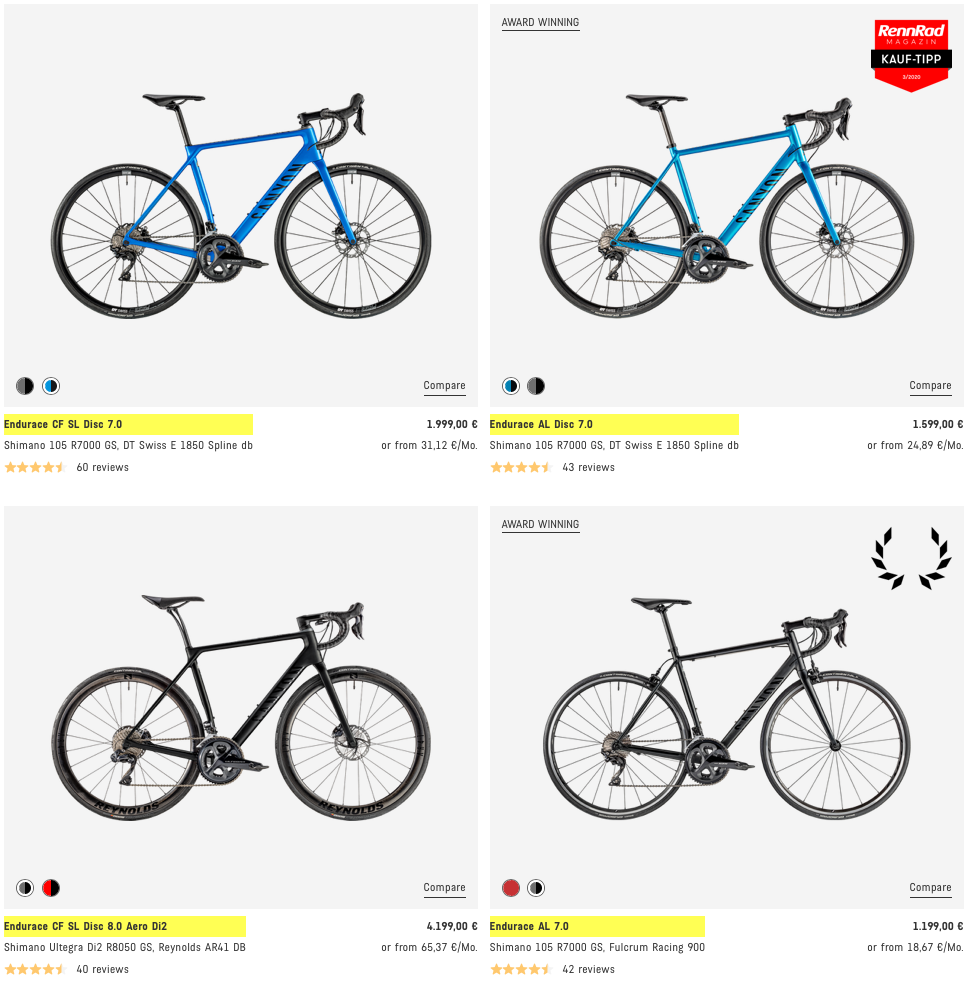

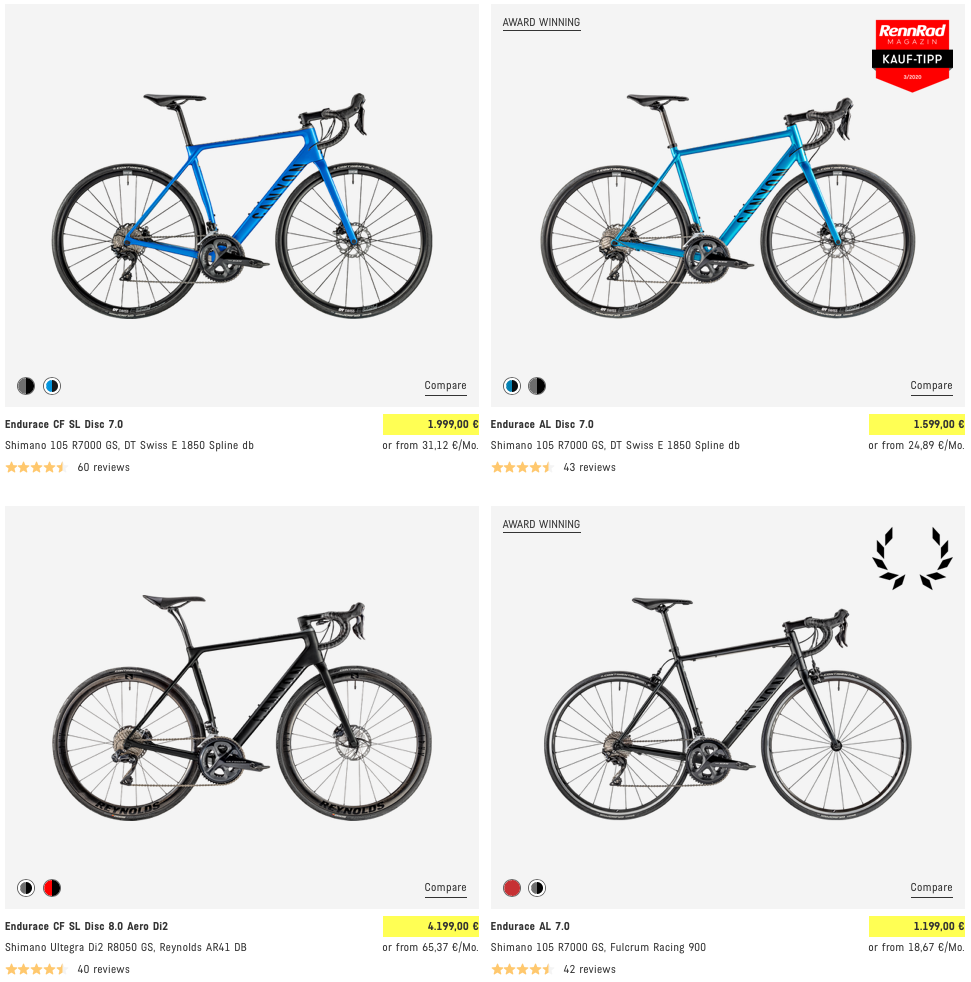

styling the classes example:

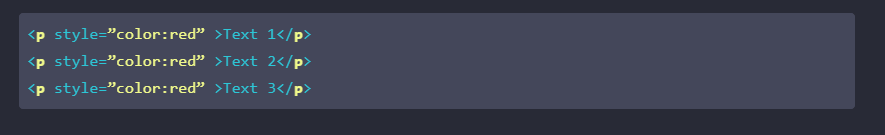

Changing multiple classes without having to change each line: 
Select, and then with a seperate CSS file, add: 

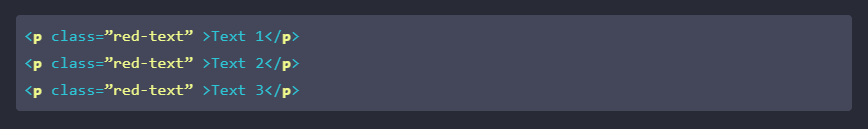

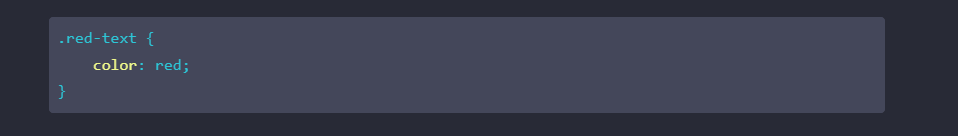

**ID / Ids **

* Using Ids to scrape a specific data 

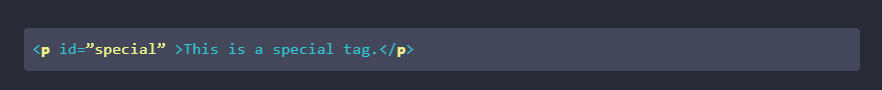

Other than CSS selector, we can use Xpath (XML path language) to select nodes 

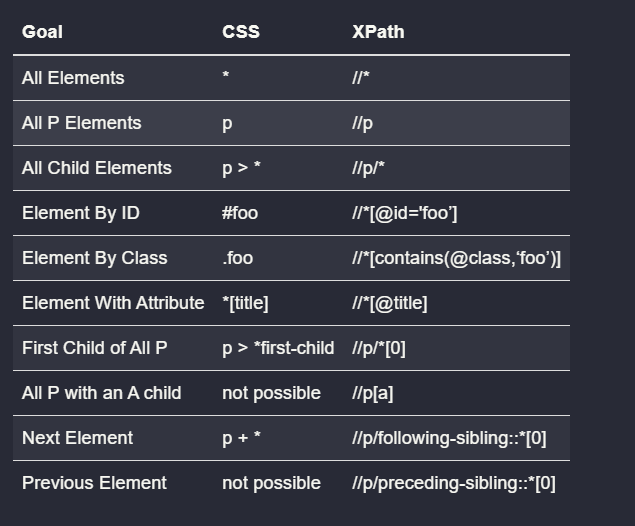



**Selector gadget**
* Tool for getting paths
* Click what element I want, and returns the CSS or Xpath code

CODE: javascript:(function()%7Bvar%20s=document.createElement('div');s.innerHTML='Loading...';s.style.color='black';s.style.padding='20px';s.style.position='fixed';s.style.zIndex='9999';s.style.fontSize='3.0em';s.style.border='2px%20solid%20black';s.style.right='40px';s.style.top='40px';s.setAttribute('class','selector_gadget_loading');s.style.background='white';document.body.appendChild(s);s=document.createElement('script');s.setAttribute('type','text/javascript');s.setAttribute('src','https://dv0akt2986vzh.cloudfront.net/unstable/lib/selectorgadget.js');document.body.appendChild(s);%7D)();

**R libraries to take HTML and CSS selectors of webpages with rvest**

* read_html(url): scrape entire HTML content from a given URL
* html_nodes(css = ".class""): calls node based on CSS class
* html_nodes(css = "#id""): calls node based on id
* html_nodes(xpath = "xpath"): calls node based on the given xpath
* html_attrs(): identifies attributes
* html_text(): strips the HTML tags and extracts only the text
* html_table(): turns HTML tables into data frames

**Data cleaning and preprocessing with stringr**

* str_detect(x, pattern) tells you if there’s any match to the pattern.
* str_count(x, pattern) counts the number of patterns.
* str_subset(x, pattern) extracts the matching components.
* str_locate(x, pattern) gives the position of the match.
* str_extract(x, pattern) extracts the text of the match.
* str_match(x, pattern) extracts parts of the match defined by parentheses.
* str_replace(x, pattern, replacement) / str_replace_all(x, pattern, replacement) replaces the matches with new text.#
* str_split(x, pattern) splits up a string into multiple pieces.

**Pattern matching functions with Regular Expression (RegEx)**

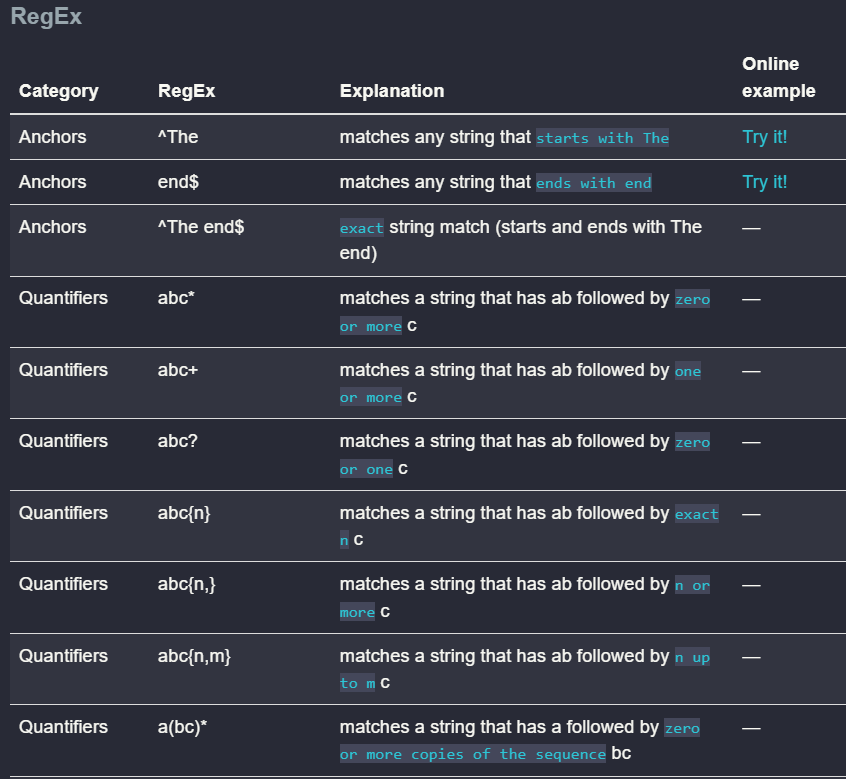

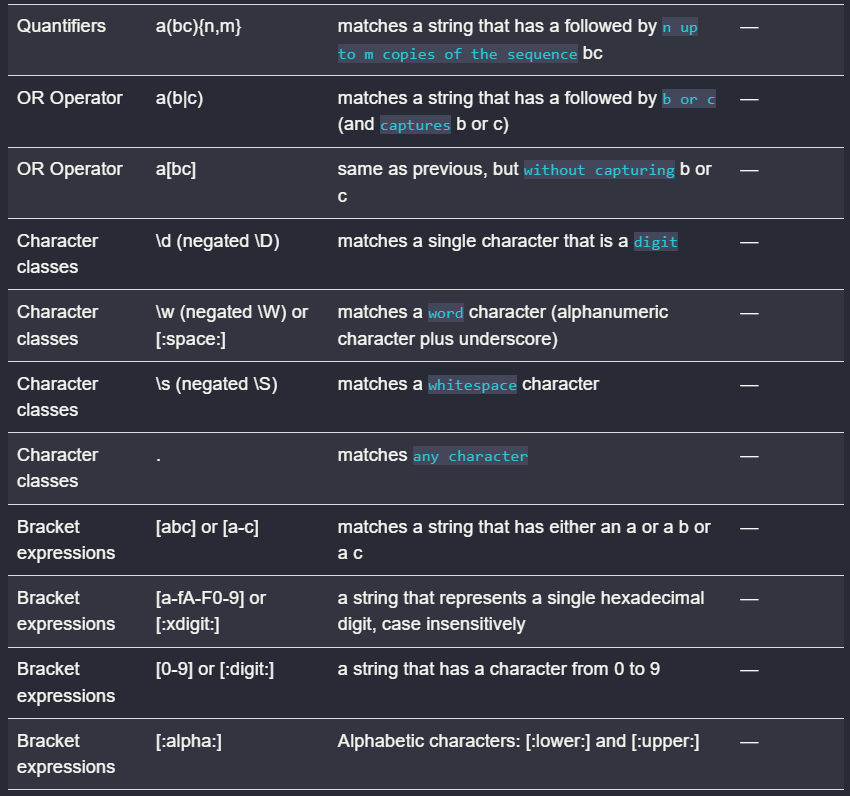

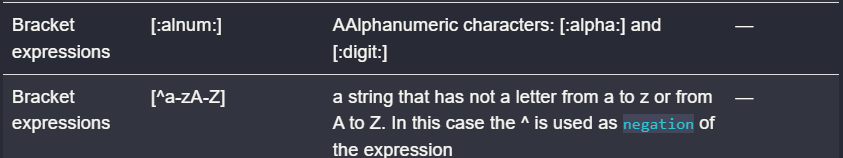

In order to be taken literally, you must escape the characters ^.[$()|*+?{\ with a backslash \ as they have special meaning. Notice that you can match also non-printable characters like tabs \t, new-lines \n, carriage returns \r.

**Greedy and Lazy match**

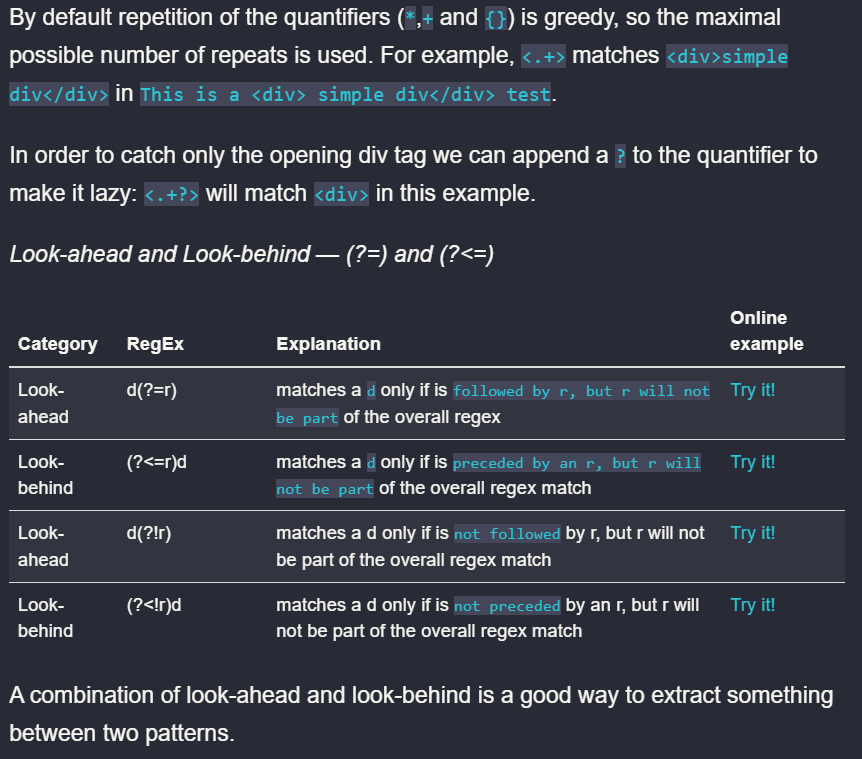


# Example 1
* get all companies from S&P 500 (wikipedia)
    * assign the wikipedia URL to a variable
    * read in the html from the URL
    * Select the correct html nodes and extract the html table
    
    
* read_html() to get the tree structure (DOM) of a webpage
* html_nodes() to pick the ID or Ids
* html_text()
* html_table() to put into a table
* [[1]] is the 1st element of an array

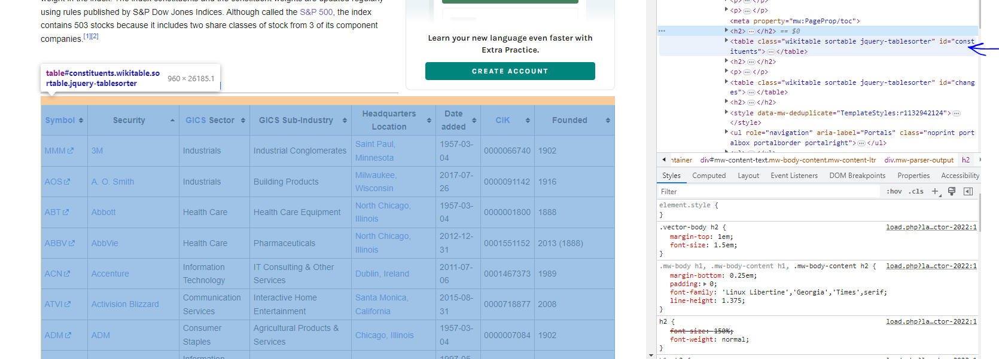


Simple Terms:
* Get the HTML for the web page that you want to scrape
* Decide what part of the page you want to read and find out what HTML/CSS you need to select it
* Select the HTML and analyze it in the way you need


In [22]:
library(rvest)


Attaching package: ‘rvest’


The following object is masked from ‘package:readr’:

    guess_encoding




In [23]:
url <- "https://en.wikipedia.org/wiki/List_of_S%26P_500_companies"

In [24]:
sp_500 <- url %>%
          # read the HTML from the webpage
          read_html() %>%
          # Get the nodes with the id
          html_nodes(css = "#constituents") %>%
          # html_nodes(xpath = "//*[@id='constituents']"") %>% 
          # Extract the table and turn the list into a tibble
          html_table() %>% 
          .[[1]] %>% 
          as_tibble()

sp_500

Symbol,Security,GICS Sector,GICS Sub-Industry,Headquarters Location,Date added,CIK,Founded
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>
MMM,3M,Industrials,Industrial Conglomerates,"Saint Paul, Minnesota",1957-03-04,66740,1902
AOS,A. O. Smith,Industrials,Building Products,"Milwaukee, Wisconsin",2017-07-26,91142,1916
ABT,Abbott,Health Care,Health Care Equipment,"North Chicago, Illinois",1957-03-04,1800,1888
ABBV,AbbVie,Health Care,Pharmaceuticals,"North Chicago, Illinois",2012-12-31,1551152,2013 (1888)
ACN,Accenture,Information Technology,IT Consulting & Other Services,"Dublin, Ireland",2011-07-06,1467373,1989
ATVI,Activision Blizzard,Communication Services,Interactive Home Entertainment,"Santa Monica, California",2015-08-31,718877,2008
ADM,ADM,Consumer Staples,Agricultural Products & Services,"Chicago, Illinois",1957-03-04,7084,1902
ADBE,Adobe Inc.,Information Technology,Application Software,"San Jose, California",1997-05-05,796343,1982
ADP,ADP,Industrials,Human Resource & Employment Services,"Roseland, New Jersey",1981-03-31,8670,1949


# Example 2
* From IMDB, current top rated movies

In [25]:
url  <- "https://www.imdb.com/chart/top/?ref_=nv_mv_250"
html <- url %>% 
          read_html()

In [26]:
html

{html_document}
<html xmlns:og="http://ogp.me/ns#" xmlns:fb="http://www.facebook.com/2008/fbml">
[1] <head>\n<meta http-equiv="Content-Type" content="text/html; charset=UTF-8 ...
[2] <body id="styleguide-v2" class="fixed">\n            <img height="1" widt ...

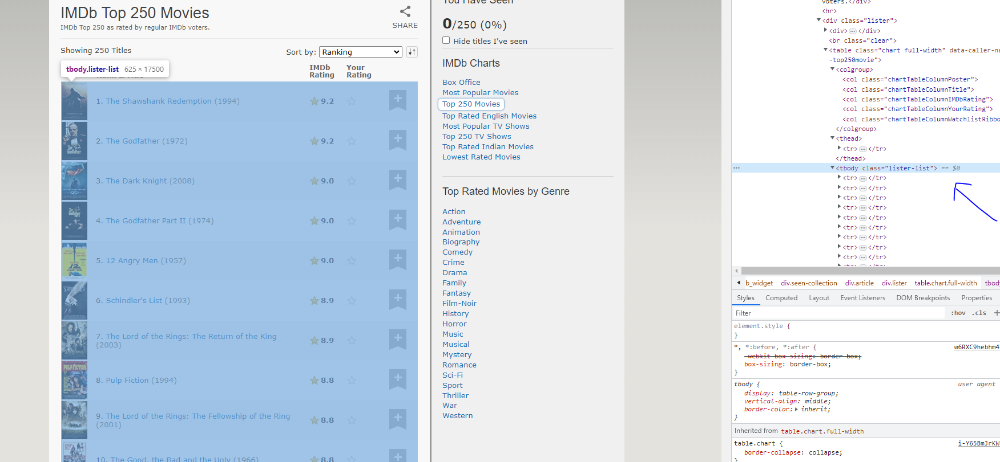

**Get ranks**
* rank no. is between " "
* name of title is in '<a ' tag

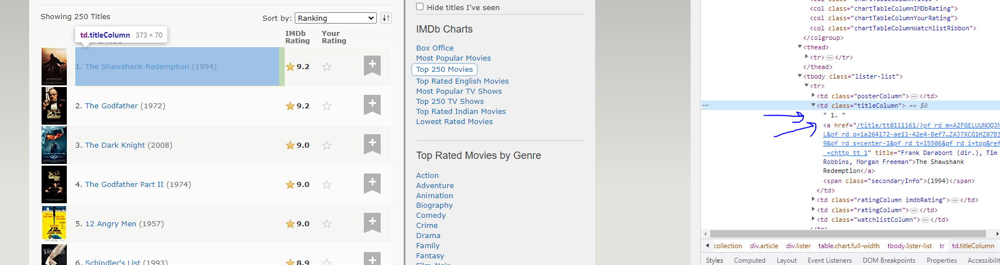

In [27]:
rank <-  html %>% 
            html_nodes(css = ".titleColumn") %>% 
            html_text() %>% 
            # Extrag all digits between " " and ".\n" The "\" have to be escaped
            # You can use Look ahead "<=" and Look behind "?=" for this
            stringr::str_extract("(?<= )[0-9]*(?=\\.\\n)")%>% 
            # Make all values numeric
            as.numeric()

rank

[1]   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
 [19]  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
 [37]  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
 [55]  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
 [73]  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
 [91]  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
[109] 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
[127] 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
[145] 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
[163] 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180
[181] 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198
[199] 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216
[217] 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234
[235] 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250

**Get Title**

* Because for some reason, the text extracted is in chinese. A translation is applied

In [28]:
title <- html %>% 
            html_nodes("td.titleColumn > a") %>% 
            html_text()

print(title)

  [1] "The Shawshank Redemption"                                            
  [2] "The Godfather"                                                       
  [3] "The Dark Knight"                                                     
  [4] "The Godfather Part II"                                               
  [5] "12 Angry Men"                                                        
  [6] "Schindler's List"                                                    
  [7] "The Lord of the Rings: The Return of the King"                       
  [8] "Pulp Fiction"                                                        
  [9] "The Lord of the Rings: The Fellowship of the Ring"                   
 [10] "The Good, the Bad and the Ugly"                                      
 [11] "Forrest Gump"                                                        
 [12] "Fight Club"                                                          
 [13] "The Lord of the Rings: The Two Towers"                               

In [29]:
resp_temp <- GET(url = "https://www.imdb.com/chart/top/?ref_=nv_mv_250",  
            add_headers('Accept-Language' = "en-US, en;q=0.5")) 
html <- content(resp_temp)

title <- html %>% 
            html_nodes("td.titleColumn > a") %>% 
            html_text()

print(title)

  [1] "The Shawshank Redemption"                                            
  [2] "The Godfather"                                                       
  [3] "The Dark Knight"                                                     
  [4] "The Godfather Part II"                                               
  [5] "12 Angry Men"                                                        
  [6] "Schindler's List"                                                    
  [7] "The Lord of the Rings: The Return of the King"                       
  [8] "Pulp Fiction"                                                        
  [9] "The Lord of the Rings: The Fellowship of the Ring"                   
 [10] "The Good, the Bad and the Ugly"                                      
 [11] "Forrest Gump"                                                        
 [12] "Fight Club"                                                          
 [13] "The Lord of the Rings: The Two Towers"                               

**Get year**

In [30]:
year <- html %>% 
          html_nodes(".titleColumn .secondaryInfo") %>%
          html_text() %>% 
          # Extract numbers
          stringr::str_extract(pattern = "[0-9]+") %>% 
          as.numeric()

year

[1] 1994 1972 2008 1974 1957 1993 2003 1994 2001 1966 1994 1999 2002 2010 1980
 [16] 1999 1990 1975 1995 1946 1954 1991 1998 2002 2014 1997 1999 1977 1991 1985
 [31] 2001 2002 1960 2019 1994 2000 1994 1998 2006 2014 2006 1995 1942 1988 1962
 [46] 2011 1936 1968 1988 1954 1979 1931 1979 2000 2012 1981 2008 2006 1950 1957
 [61] 1980 1940 2018 1957 1986 2018 1999 1964 2012 2009 2003 1984 2017 1995 1995
 [76] 2019 1981 2019 1997 1997 1984 2016 1952 2009 2000 1963 2010 2018 1983 1968
 [91] 2004 1985 1992 2012 1962 1941 1931 1952 1959 1960 1958 2001 1944 1971 1987
[106] 1983 2010 1995 2020 2009 1962 1973 2011 1927 1988 1997 1989 1976 2000 1948
[121] 2007 2019 2022 2004 2016 1965 2005 1921 1959 2020 1950 2013 2018 1961 1985
[136] 1995 1998 2007 2006 1992 2010 1999 1993 2001 2023 1961 1948 1975 2007 2003
[151] 1963 1950 1982 2003 2021 1980 1974 2005 1980 1939 1954 1998 2015 2004 2009
[166] 2017 1996 1957 2013 1996 2011 2008 2002 1988 2004 1997 1982 1925 2019 2011
[181] 1995 2013 1959 2014 1954 2014 1926 1975 1957 1993 1978 2016 1949 1953 2003
[196] 1924 2014 1939 2015 2009 2010 1989 2001 1957 2023 1975 2015 1998 1953 2019
[211] 1928 2004 1976 2007 1986 2017 2015 1984 1986 2013 1976 2004 1939 2007 1946
[226] 1973 1993 2004 1995 1942 2003 2009 1940 1966 1955 2021 2000 2005 1940 2016
[241] 1967 1965 1959 1934 1966 1979 1999 2011 1992 1990

**Get people (director)**

In [31]:
people <- html %>% 
            html_nodes(".titleColumn > a") %>% 
            html_attr("title")

people

[1] "Frank Darabont (dir.), Tim Robbins, Morgan Freeman"                  
  [2] "Francis Ford Coppola (dir.), Marlon Brando, Al Pacino"               
  [3] "Christopher Nolan (dir.), Christian Bale, Heath Ledger"              
  [4] "Francis Ford Coppola (dir.), Al Pacino, Robert De Niro"              
  [5] "Sidney Lumet (dir.), Henry Fonda, Lee J. Cobb"                       
  [6] "Steven Spielberg (dir.), Liam Neeson, Ralph Fiennes"                 
  [7] "Peter Jackson (dir.), Elijah Wood, Viggo Mortensen"                  
  [8] "Quentin Tarantino (dir.), John Travolta, Uma Thurman"                
  [9] "Peter Jackson (dir.), Elijah Wood, Ian McKellen"                     
 [10] "Sergio Leone (dir.), Clint Eastwood, Eli Wallach"                    
 [11] "Robert Zemeckis (dir.), Tom Hanks, Robin Wright"                     
 [12] "David Fincher (dir.), Brad Pitt, Edward Norton"                      
 [13] "Peter Jackson (dir.), Elijah Wood, Ian McKellen"                     
 [14] "Christopher Nolan (dir.), Leonardo DiCaprio, Joseph Gordon-Levitt"   
 [15] "Irvin Kershner (dir.), Mark Hamill, Harrison Ford"                   
 [16] "Lana Wachowski (dir.), Keanu Reeves, Laurence Fishburne"             
 [17] "Martin Scorsese (dir.), Robert De Niro, Ray Liotta"                  
 [18] "Milos Forman (dir.), Jack Nicholson, Louise Fletcher"                
 [19] "David Fincher (dir.), Morgan Freeman, Brad Pitt"                     
 [20] "Frank Capra (dir.), James Stewart, Donna Reed"                       
 [21] "Akira Kurosawa (dir.), Toshirô Mifune, Takashi Shimura"              
 [22] "Jonathan Demme (dir.), Jodie Foster, Anthony Hopkins"                
 [23] "Steven Spielberg (dir.), Tom Hanks, Matt Damon"                      
 [24] "Fernando Meirelles (dir.), Alexandre Rodrigues, Leandro Firmino"     
 [25] "Christopher Nolan (dir.), Matthew McConaughey, Anne Hathaway"        
 [26] "Roberto Benigni (dir.), Roberto Benigni, Nicoletta Braschi"          
 [27] "Frank Darabont (dir.), Tom Hanks, Michael Clarke Duncan"             
 [28] "George Lucas (dir.), Mark Hamill, Harrison Ford"                     
 [29] "James Cameron (dir.), Arnold Schwarzenegger, Linda Hamilton"         
 [30] "Robert Zemeckis (dir.), Michael J. Fox, Christopher Lloyd"           
 [31] "Hayao Miyazaki (dir.), Daveigh Chase, Suzanne Pleshette"             
 [32] "Roman Polanski (dir.), Adrien Brody, Thomas Kretschmann"             
 [33] "Alfred Hitchcock (dir.), Anthony Perkins, Janet Leigh"               
 [34] "Bong Joon Ho (dir.), Song Kang-ho, Lee Sun-kyun"                     
 [35] "Luc Besson (dir.), Jean Reno, Gary Oldman"                           
 [36] "Ridley Scott (dir.), Russell Crowe, Joaquin Phoenix"                 
 [37] "Roger Allers (dir.), Matthew Broderick, Jeremy Irons"                
 [38] "Tony Kaye (dir.), Edward Norton, Edward Furlong"                     
 [39] "Martin Scorsese (dir.), Leonardo DiCaprio, Matt Damon"               
 [40] "Damien Chazelle (dir.), Miles Teller, J.K. Simmons"                  
 [41] "Christopher Nolan (dir.), Christian Bale, Hugh Jackman"              
 [42] "Bryan Singer (dir.), Kevin Spacey, Gabriel Byrne"                    
 [43] "Michael Curtiz (dir.), Humphrey Bogart, Ingrid Bergman"              
 [44] "Isao Takahata (dir.), Tsutomu Tatsumi, Ayano Shiraishi"              
 [45] "Masaki Kobayashi (dir.), Tatsuya Nakadai, Akira Ishihama"            
 [46] "Olivier Nakache (dir.), François Cluzet, Omar Sy"                    
 [47] "Charles Chaplin (dir.), Charles Chaplin, Paulette Goddard"           
 [48] "Sergio Leone (dir.), Henry Fonda, Charles Bronson"                   
 [49] "Giuseppe Tornatore (dir.), Philippe Noiret, Enzo Cannavale"          
 [50] "Alfred Hitchcock (dir.), James Stewart, Grace Kelly"                 
 [51] "Ridley Scott (dir.), Sigourney Weaver, Tom Skerritt"                 
 [52] "Charles Chaplin (dir.), Charles Chaplin, Virginia Cherrill"         

**Get rating**

In [32]:
rating <- html %>% 
            html_nodes(css = ".imdbRating > strong") %>% 
            html_text() %>% 
            as.numeric()

rating

[1] 9.2 9.2 9.0 9.0 9.0 8.9 8.9 8.8 8.8 8.8 8.8 8.7 8.7 8.7 8.7 8.7 8.7 8.6
 [19] 8.6 8.6 8.6 8.6 8.6 8.6 8.6 8.6 8.6 8.5 8.5 8.5 8.5 8.5 8.5 8.5 8.5 8.5
 [37] 8.5 8.5 8.5 8.5 8.5 8.5 8.5 8.5 8.5 8.5 8.4 8.4 8.4 8.4 8.4 8.4 8.4 8.4
 [55] 8.4 8.4 8.4 8.4 8.4 8.4 8.4 8.4 8.4 8.4 8.3 8.3 8.3 8.3 8.3 8.3 8.3 8.3
 [73] 8.3 8.3 8.3 8.3 8.3 8.3 8.3 8.3 8.3 8.3 8.3 8.3 8.3 8.3 8.3 8.3 8.3 8.3
 [91] 8.3 8.3 8.3 8.3 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2
[109] 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2
[127] 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2 8.2
[145] 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1
[163] 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1
[181] 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1
[199] 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.1 8.0 8.0 8.0 8.0 8.0
[217] 8.0 8.0 8.0 8.0 8.0 8.0 8.0 8.0 8.0 8.0 8.0 8.0 8.0 8.0 8.0 8.0 8.0 8.0
[235] 8.0 8.0 8.0 8.0 8.0 8.0 8.0 8.0 8.0 8.0 8.0 8.0 8.0 8.0 8.0 8.0

**Get number of ratings**

In [33]:
num_ratings <- html %>% 
              html_nodes(css = ".imdbRating > strong") %>% 
              html_attr('title') %>% 
              # Extract the numbers and remove the comma to make it numeric values
                #example value: "9.2 based on 2,740,088 user ratings"  
              stringr::str_extract("(?<=based on ).*(?=\ user ratings)" ) %>% 
              stringr::str_replace_all(pattern = ",", replacement = "") %>% 
              as.numeric()

num_ratings

[1] 2741145 1906215 2714009 1299081  811426 1383316 1884558 2106378 1913321
 [10]  776238 2132845 2182734 1701131 2409186 1319258 1954927 1189652 1027528
 [19] 1694852  471586  352418 1465473 1421440  770018 1905504  710204 1333008
 [28] 1391789 1121575 1236556  788165  854605  686735  851869 1187590 1534036
 [37] 1083460 1142094 1354253  902182 1362525 1103265  582844  286740   60785
 [46]  880289  248017  336736  268061  501336  902105  188358  681378 1261945
 [55] 1596730  984916 1141109  396304  226624  201999 1047499  228447 1120413
 [64]  129331  731701  561759 1172558  499882 1739234 1489354  595329  409299
 [73]  532458 1016461 1054697 1350671  255410 1176866  406047 1001982  359823
 [82]  285644  248629  410290  860589   47690  853839   94976 1076121  684458
 [91] 1030053   85571 1041568  340828  300744  450210  161534   81669  334237
[100]  186375  410473  768987  160662  846897  757761  864663  183600  673997
[109]  101054 1067758  321917  269271  249258  178101  900422  592615  770086
[118]  862271  873005  167378  197751  619307  584995  362027  197002  262499
[127] 1501207  129151  272843  167877  133924 1459930  517751   79832  128942
[136]  533868 1115048  601533  680327  420415 1358179 1010006 1012494  949333
[145]  123203  125732  127776  551281 1000030 1139333  249258  172536  437895
[154] 1065072  794060  247539  334316 1139714  362668  322114  180347  594510
[163]  734964  410875  213919  525197  700420  225429  744130  691982  481378
[172]  788837 1019087  351927  699355   76605  786912  113769  165767  899137
[181]  319861  715001  244929  837043  158359 1007231   93755  173502  109881
[190]  179668  346366  548368  175214   63097  195263   52317  204918  117509
[199] 1028470  180632  760052  508802  930652  189656  149700  622798  431191
[208]  826210   64005  417005   57200  361594  597414  764593  422869  786073
[217]  481604  884245  416767  490504  163312  273455  409891  634485   67002
[226]  420585  649692  760000  181083   39571 1152032  294422   96033   62335
[235]   34932  206540  245160   88121  140656  156584  181490  244239  121960
[244]  107135  123428  408441  208513  471826  435733  276049

**Merge into a table or tibble**

In [34]:
imdb_tbl <- tibble(rank, title, year, people, rating, num_ratings)

imdb_tbl

rank,title,year,people,rating,num_ratings
<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>
1,The Shawshank Redemption,1994,"Frank Darabont (dir.), Tim Robbins, Morgan Freeman",9.2,2741145
2,The Godfather,1972,"Francis Ford Coppola (dir.), Marlon Brando, Al Pacino",9.2,1906215
3,The Dark Knight,2008,"Christopher Nolan (dir.), Christian Bale, Heath Ledger",9.0,2714009
4,The Godfather Part II,1974,"Francis Ford Coppola (dir.), Al Pacino, Robert De Niro",9.0,1299081
5,12 Angry Men,1957,"Sidney Lumet (dir.), Henry Fonda, Lee J. Cobb",9.0,811426
6,Schindler's List,1993,"Steven Spielberg (dir.), Liam Neeson, Ralph Fiennes",8.9,1383316
7,The Lord of the Rings: The Return of the King,2003,"Peter Jackson (dir.), Elijah Wood, Viggo Mortensen",8.9,1884558
8,Pulp Fiction,1994,"Quentin Tarantino (dir.), John Travolta, Uma Thurman",8.8,2106378
9,The Lord of the Rings: The Fellowship of the Ring,2001,"Peter Jackson (dir.), Elijah Wood, Ian McKellen",8.8,1913321


# Example 3

In [35]:
library(httr)
library(jsonlite)

In [36]:
api_url <- "https://api.coindesk.com/v1/bpi/currentprice.json"  # Replace with the actual API endpoint

In [37]:
response <- GET(api_url)

In [38]:
data <- content(response, as = "text")

No encoding supplied: defaulting to UTF-8.



In [39]:
print(data)

[1] "{\"time\":{\"updated\":\"May 21, 2023 09:32:00 UTC\",\"updatedISO\":\"2023-05-21T09:32:00+00:00\",\"updateduk\":\"May 21, 2023 at 10:32 BST\"},\"disclaimer\":\"This data was produced from the CoinDesk Bitcoin Price Index (USD). Non-USD currency data converted using hourly conversion rate from openexchangerates.org\",\"chartName\":\"Bitcoin\",\"bpi\":{\"USD\":{\"code\":\"USD\",\"symbol\":\"&#36;\",\"rate\":\"27,057.0004\",\"description\":\"United States Dollar\",\"rate_float\":27057.0004},\"GBP\":{\"code\":\"GBP\",\"symbol\":\"&pound;\",\"rate\":\"22,608.6130\",\"description\":\"British Pound Sterling\",\"rate_float\":22608.613},\"EUR\":{\"code\":\"EUR\",\"symbol\":\"&euro;\",\"rate\":\"26,357.4687\",\"description\":\"Euro\",\"rate_float\":26357.4687}}}"


In [40]:
#parsedData <- content(response, as = "parsed")
parsedData <- content(response)

In [41]:
print(parsedData)

  [1] 7b 22 74 69 6d 65 22 3a 7b 22 75 70 64 61 74 65 64 22 3a 22 4d 61 79 20 32
 [26] 31 2c 20 32 30 32 33 20 30 39 3a 33 32 3a 30 30 20 55 54 43 22 2c 22 75 70
 [51] 64 61 74 65 64 49 53 4f 22 3a 22 32 30 32 33 2d 30 35 2d 32 31 54 30 39 3a
 [76] 33 32 3a 30 30 2b 30 30 3a 30 30 22 2c 22 75 70 64 61 74 65 64 75 6b 22 3a
[101] 22 4d 61 79 20 32 31 2c 20 32 30 32 33 20 61 74 20 31 30 3a 33 32 20 42 53
[126] 54 22 7d 2c 22 64 69 73 63 6c 61 69 6d 65 72 22 3a 22 54 68 69 73 20 64 61
[151] 74 61 20 77 61 73 20 70 72 6f 64 75 63 65 64 20 66 72 6f 6d 20 74 68 65 20
[176] 43 6f 69 6e 44 65 73 6b 20 42 69 74 63 6f 69 6e 20 50 72 69 63 65 20 49 6e
[201] 64 65 78 20 28 55 53 44 29 2e 20 4e 6f 6e 2d 55 53 44 20 63 75 72 72 65 6e
[226] 63 79 20 64 61 74 61 20 63 6f 6e 76 65 72 74 65 64 20 75 73 69 6e 67 20 68
[251] 6f 75 72 6c 79 20 63 6f 6e 76 65 72 73 69 6f 6e 20 72 61 74 65 20 66 72 6f
[276] 6d 20 6f 70 65 6e 65 78 63 68 61 6e 67 65 72 61 74 65 73 2e 6f 72 67 22 2c
[301] 22 63 68 61 72 74 4e 6

In [42]:
data_list <- fromJSON(data)

In [43]:
#data_flat <- flatten(data_list, recursive = FALSE)

In [44]:
#data_table <- as.table(as.data.frame(t(data_flat)))

In [45]:
#print(data_table)

In [46]:
print(data_list)

$time
$time$updated
[1] "May 21, 2023 09:32:00 UTC"

$time$updatedISO
[1] "2023-05-21T09:32:00+00:00"

$time$updateduk
[1] "May 21, 2023 at 10:32 BST"


$disclaimer
[1] "This data was produced from the CoinDesk Bitcoin Price Index (USD). Non-USD currency data converted using hourly conversion rate from openexchangerates.org"

$chartName
[1] "Bitcoin"

$bpi
$bpi$USD
$bpi$USD$code
[1] "USD"

$bpi$USD$symbol
[1] "&#36;"

$bpi$USD$rate
[1] "27,057.0004"

$bpi$USD$description
[1] "United States Dollar"

$bpi$USD$rate_float
[1] 27057


$bpi$GBP
$bpi$GBP$code
[1] "GBP"

$bpi$GBP$symbol
[1] "&pound;"

$bpi$GBP$rate
[1] "22,608.6130"

$bpi$GBP$description
[1] "British Pound Sterling"

$bpi$GBP$rate_float
[1] 22608.61


$bpi$EUR
$bpi$EUR$code
[1] "EUR"

$bpi$EUR$symbol
[1] "&euro;"

$bpi$EUR$rate
[1] "26,357.4687"

$bpi$EUR$description
[1] "Euro"

$bpi$EUR$rate_float
[1] 26357.47





# Functional programming
* Scraping more than 1 page, using iterate, over the content
* iterate using for-loop: 
    * for (variables in vector) { ...... }

In [47]:
# Example: For Loop
numbers <- c(1:5)
for (i in numbers) {
   print(i)
}

[1] 1
[1] 2
[1] 3
[1] 4
[1] 5


**Iterate using purrr**
* map() is the same as the standard R library lapply(), sapply(), vapply()

In [48]:
numbers_list <- map(numbers, print)

[1] 1
[1] 2
[1] 3
[1] 4
[1] 5


In [49]:
bike_data_lst <- fromJSON("/kaggle/input/bike-training-dataset/bike_data.json") 
# Open the data by clicking on it in the environment or by running View()
View(bike_data_lst) 

$app
$app$basePath
[1] "/on/demandware.static/Sites-RoW-Site/-/en_DE/v1593074273878/"

$app$additionalScripts
list()

$app$locale
[1] "en_DE"

$app$datepickerFormat
[1] "F j, Y"

$app$phoneNumberAvailablePhoneCodes
 [1] "AE" "AL" "AT" "AU" "BE" "BG" "BH" "BM" "BN" "BO" "BR" "BT" "CA" "CH" "CL"
[16] "CN" "CO" "CR" "CY" "CZ" "DE" "DK" "EC" "EE" "EG" "ES" "FI" "FR" "GB" "GR"
[31] "GT" "HK" "HN" "HR" "HU" "ID" "IE" "IL" "IN" "IS" "IT" "JP" "KG" "KR" "KW"
[46] "KZ" "LB" "LT" "LU" "LV" "MK" "MO" "MT" "MU" "MX" "MY" "NL" "NO" "NZ" "OM"
[61] "PA" "PE" "PH" "PL" "PT" "QA" "RO" "RS" "SA" "SE" "SG" "SI" "SK" "TH" "TR"
[76] "TW" "UA" "US" "ZA" "ZM"

$app$phoneNumberLocalizedCountries
$app$phoneNumberLocalizedCountries$ae
[1] "United Arab Emirates"

$app$phoneNumberLocalizedCountries$al
[1] "Albania"

$app$phoneNumberLocalizedCountries$at
[1] "Austria"

$app$phoneNumberLocalizedCountries$au
[1] "Australia"

$app$phoneNumberLocalizedCountries$be
[1] "Belgium"

$app$phoneNumberLocalizedCountries$bg
[1] "Bulgaria"

$app$phoneNumberLocalizedCountries$bh
[1] "Bahrain"

$app$phoneNumberLocalizedCountries$bm
[1] "Bermuda"

$app$phoneNumberLocalizedCountries$bn
[1] "Brunei"

$app$phoneNumberLocalizedCountries$bo
[1] "Bolivia"

$app$phoneNumberLocalizedCountries$br
[1] "Brazil"

$app$phoneNumberLocalizedCountries$bt
[1] "Bhutan"

$app$phoneNumberLocalizedCountries$ca
[1] "Canada"

$app$phoneNumberLocalizedCountries$ch
[1] "Switzerland"

$app$phoneNumberLocalizedCountries$cl
[1] "Chile"

$app$phoneNumberLocalizedCountries$cn
[1] "China"

$app$phoneNumberLocalizedCountries$co
[1] "Colombia"

$app$phoneNumberLocalizedCountries$cr
[1] "Costa Rica"

$app$phoneNumberLocalizedCountries$cy
[1] "Cyprus"

$app$phoneNumberLocalizedCountries$cz
[1] "Czech Republic"

$app$phoneNumberLocalizedCountries$de
[1] "Germany"

$app$phoneNumberLocalizedCountries$dk
[1] "Denmark"

$app$phoneNumberLocalizedCountries$ec
[1] "Ecuador"

$app$phoneNumberLocalizedCountries$ee
[1] "Estonia"

$app$phoneNumberLocalizedCountries$eg
[1] "Egypt"

$app$phoneNumberLocalizedCountries$es
[1] "Spain"

$app$phoneNumberLocalizedCountries$fi
[1] "Finland"

$app$phoneNumberLocalizedCountries$fr
[1] "France"

$app$phoneNumberLocalizedCountries$gb
[1] "United Kingdom"

$app$phoneNumberLocalizedCountries$gr
[1] "Greece"

$app$phoneNumberLocalizedCountries$gt
[1] "Guatemala"

$app$phoneNumberLocalizedCountries$hk
[1] "Hong Kong"

$app$phoneNumberLocalizedCountries$hn
[1] "Honduras"

$app$phoneNumberLocalizedCountries$hr
[1] "Croatia"

$app$phoneNumberLocalizedCountries$hu
[1] "Hungary"

$app$phoneNumberLocalizedCountries$id
[1] "Indonesia"

$app$phoneNumberLocalizedCountries$ie
[1] "Ireland"

$app$phoneNumberLocalizedCountries$il
[1] "Israel"

$app$phoneNumberLocalizedCountries$`in`
[1] "India"

$app$phoneNumberLocalizedCountries$is
[1] "Iceland"

$app$phoneNumberLocalizedCountries$it
[1] "Italy"

$app$phoneNumberLocalizedCountries$jp
[1] "Japan"

$app$phoneNumberLocalizedCountries$kg
[1] "Kyrgyzstan"

$app$phoneNumberLocalizedCountries$kr
[1] "South Korea"

$app$phoneNumberLocalizedCountries$kw
[1] "Kuwait"

$app$phoneNumberLocalizedCountries$kz
[1] "Kazakhstan"

$app$phoneNumberLocalizedCountries$lb
[1] "Lebanon"

$app$phoneNumberLocalizedCountries$lt
[1] "Lithuania"

$app$phoneNumberLocalizedCountries$lu
[1] "Luxembourg"

$app$phoneNumberLocalizedCountries$lv
[1] "Latvia"

$app$phoneNumberLocalizedCountries$mk
[1] "Macedonia"

$app$phoneNumberLocalizedCountries$mo
[1] "Macao"

$app$phoneNumberLocalizedCountries$mt
[1] "Malta"

$app$phoneNumberLocalizedCountries$mu
[1] "Mauritius"

$app$phoneNumberLocalizedCountries$mx
[1] "Mexico"

$app$phoneNumberLocalizedCountries$my
[1] "Malaysia"

$app$phoneNumberLocalizedCountries$nl
[1] "Netherlands"

$app$phoneNumberLocalizedCountries$no
[1] "Norway"

$app$phoneNumberLocalizedCountries$nz
[1] "New Zealand"

$app$phoneNumberLocalizedCountries$om
[1] "Oman"

$app$phoneNumberLocalizedCountries$pa
[1] "Panama"

$app$phoneNumberLocalizedCountries$pe
[1] "Pe

In [50]:
#productDetail --> variationAttributes --> values --> [[1]] --> displayValue

In [51]:
bike_data_lst[["productDetail"]][["variationAttributes"]][["values"]][[1]][["displayValue"]]
## "Stealth"     "aero silver"

[1] "Stealth"     "aero silver"

In [52]:
bike_data_lst %>% 
    purrr::pluck("productDetail", "variationAttributes", "values", 1, "displayValue") 

[1] "Stealth"     "aero silver"

****

# BUSINESS CASE
* Contact scraping, monitoring/comparing prices, scraping reviews/ratings etc. 
* Web scraping all bike models from bike manufacturer (Canyon) https://www.canyon.com/en-de/
* Put into a strategic database with competitor product data
* Find a way to get all individual product URLs to scrape content for our strategic database
* Goal: Get data for every bike in every available color scheme, by constructing the product URLs for each individual bike and color combination


**Structure of the web**

https://www.canyon.com/en-de/

URL Base path / Landing Page / Home

**URL for product families**

https://www.canyon.com/en-de/road-bikes/

**URL for product categories (ride style)**

https://www.canyon.com/en-de/road-bikes/endurance-bikes/endurace/

**URL with query parameter (after ?, with color/rahmenfarbe black, size/rahmengroesse medium)**

https://www.canyon.com/en-de/endurace-cf-slx-disc-9.0-etap/2399.html?dwvar_2399_pv_rahmenfarbe=BK&dwvar_2399_pv_rahmengroesse=M&quantity=1

**Libraries**

In [53]:
# WEBSCRAPING ----

# 1.0 LIBRARIES ----

library(tidyverse) # Main Package - Loads dplyr, purrr, etc.
library(rvest)     # HTML Hacking & Web Scraping
library(xopen)     # Quickly opening URLs
library(jsonlite)  # converts JSON files to R objects
library(glue)      # concatenate strings
library(stringi)   # character string/text processing

**Page Analysis**

# ALOT of the canyon webpage has been changed since the tutorial was made, so the tutorial is useless for now 

****

# Challenge 1

1. Get data via API (any website) 
    1. In this case: universities in germany
1. Create a table and plot information

In [54]:
api_url = "http://universities.hipolabs.com/search?country=germany"

In [55]:
response = GET(api_url)
data = content(response, as = "text")
data_list = fromJSON(data)

No encoding supplied: defaulting to UTF-8.



In [56]:
tibble(data_list)

country,alpha_two_code,web_pages,state-province,domains,name
<chr>,<chr>,<list>,<chr>,<list>,<chr>
Germany,DE,http://www.akad.de/,NA,akad.de,"AKAD Hochschulen für Berufstätige, Fachhochschule Leipzig"
Germany,DE,http://www.akad.de/,NA,akad.de,Hochschule für Berufstätige Rendsburg
Germany,DE,http://www.asfh-berlin.de/,NA,asfh-berlin.de,Alice-Salomon-Fachhochschule für Sozialarbeit und Sozialpädagogik Berlin
Germany,DE,http://www.augustana.de/,NA,augustana.de,Augustana Hochschule Neuendettelsau
Germany,DE,http://www.bethel.de/kiho/,NA,bethel.de,Kirchliche Hochschule Bethel
Germany,DE,http://www.bits-iserlohn.de/,NA,bits-iserlohn.de,BiTS - Business and Information Technology School gGmbH
Germany,DE,http://www.cbs.de/,NA,cbs.de,Cologne Business School
Germany,DE,http://code.berlin/,NA,code.berlin,CODE University of Applied Sciences Berlin
Germany,DE,http://www.dhv-speyer.de/,NA,dhv-speyer.de,Deutsche Hochschule für Verwaltungswissenschaften Speyer


In [57]:
cleaner_data_list = tibble(data_list) %>% 
    dplyr::select(everything()) %>%
    set_names(names(.) %>% str_replace_all("\\-", "_")) %>% 
    dplyr::mutate(name = gsub("-", " ", name))

In [58]:
cleaner_data_list

country,alpha_two_code,web_pages,state_province,domains,name
<chr>,<chr>,<list>,<chr>,<list>,<chr>
Germany,DE,http://www.akad.de/,NA,akad.de,"AKAD Hochschulen für Berufstätige, Fachhochschule Leipzig"
Germany,DE,http://www.akad.de/,NA,akad.de,Hochschule für Berufstätige Rendsburg
Germany,DE,http://www.asfh-berlin.de/,NA,asfh-berlin.de,Alice Salomon Fachhochschule für Sozialarbeit und Sozialpädagogik Berlin
Germany,DE,http://www.augustana.de/,NA,augustana.de,Augustana Hochschule Neuendettelsau
Germany,DE,http://www.bethel.de/kiho/,NA,bethel.de,Kirchliche Hochschule Bethel
Germany,DE,http://www.bits-iserlohn.de/,NA,bits-iserlohn.de,BiTS Business and Information Technology School gGmbH
Germany,DE,http://www.cbs.de/,NA,cbs.de,Cologne Business School
Germany,DE,http://code.berlin/,NA,code.berlin,CODE University of Applied Sciences Berlin
Germany,DE,http://www.dhv-speyer.de/,NA,dhv-speyer.de,Deutsche Hochschule für Verwaltungswissenschaften Speyer


In [59]:
smaller_cleaner_data_list = head(cleaner_data_list, n= 20) %>% 
    dplyr::select(-(alpha_two_code), -(state_province))

smaller_cleaner_data_list

country,web_pages,domains,name
<chr>,<list>,<list>,<chr>
Germany,http://www.akad.de/,akad.de,"AKAD Hochschulen für Berufstätige, Fachhochschule Leipzig"
Germany,http://www.akad.de/,akad.de,Hochschule für Berufstätige Rendsburg
Germany,http://www.asfh-berlin.de/,asfh-berlin.de,Alice Salomon Fachhochschule für Sozialarbeit und Sozialpädagogik Berlin
Germany,http://www.augustana.de/,augustana.de,Augustana Hochschule Neuendettelsau
Germany,http://www.bethel.de/kiho/,bethel.de,Kirchliche Hochschule Bethel
Germany,http://www.bits-iserlohn.de/,bits-iserlohn.de,BiTS Business and Information Technology School gGmbH
Germany,http://www.cbs.de/,cbs.de,Cologne Business School
Germany,http://code.berlin/,code.berlin,CODE University of Applied Sciences Berlin
Germany,http://www.dhv-speyer.de/,dhv-speyer.de,Deutsche Hochschule für Verwaltungswissenschaften Speyer


In [60]:
library(stringr)

In [61]:
#word_counts <- str_count(data_list$name, "\\S+")
#word_counts = sapply(data_list$name, function(name) length(strsplit(name, "[\\s-]+")[[1]]))

word_counts = sapply(smaller_cleaner_data_list$name, function(name) str_count(name, "\\S+"))

In [62]:
smaller_cleaner_data_list$simple_name <- word_counts


In [63]:
tibble(smaller_cleaner_data_list)

country,web_pages,domains,name,simple_name
<chr>,<list>,<list>,<chr>,<int>
Germany,http://www.akad.de/,akad.de,"AKAD Hochschulen für Berufstätige, Fachhochschule Leipzig",6
Germany,http://www.akad.de/,akad.de,Hochschule für Berufstätige Rendsburg,4
Germany,http://www.asfh-berlin.de/,asfh-berlin.de,Alice Salomon Fachhochschule für Sozialarbeit und Sozialpädagogik Berlin,8
Germany,http://www.augustana.de/,augustana.de,Augustana Hochschule Neuendettelsau,3
Germany,http://www.bethel.de/kiho/,bethel.de,Kirchliche Hochschule Bethel,3
Germany,http://www.bits-iserlohn.de/,bits-iserlohn.de,BiTS Business and Information Technology School gGmbH,7
Germany,http://www.cbs.de/,cbs.de,Cologne Business School,3
Germany,http://code.berlin/,code.berlin,CODE University of Applied Sciences Berlin,6
Germany,http://www.dhv-speyer.de/,dhv-speyer.de,Deutsche Hochschule für Verwaltungswissenschaften Speyer,5


In [64]:
library(lubridate)

In [65]:
simplicity_of_name = smaller_cleaner_data_list %>%
    dplyr::select(name, simple_name)

kable(simplicity_of_name)



|name                                                                                                 | simple_name|
|:----------------------------------------------------------------------------------------------------|-----------:|
|AKAD Hochschulen für Berufstätige, Fachhochschule Leipzig                                            |           6|
|Hochschule für Berufstätige Rendsburg                                                                |           4|
|Alice Salomon Fachhochschule für Sozialarbeit und Sozialpädagogik Berlin                             |           8|
|Augustana Hochschule Neuendettelsau                                                                  |           3|
|Kirchliche Hochschule Bethel                                                                         |           3|
|BiTS   Business and Information Technology School gGmbH                                              |           7|
|Cologne Business School                                      

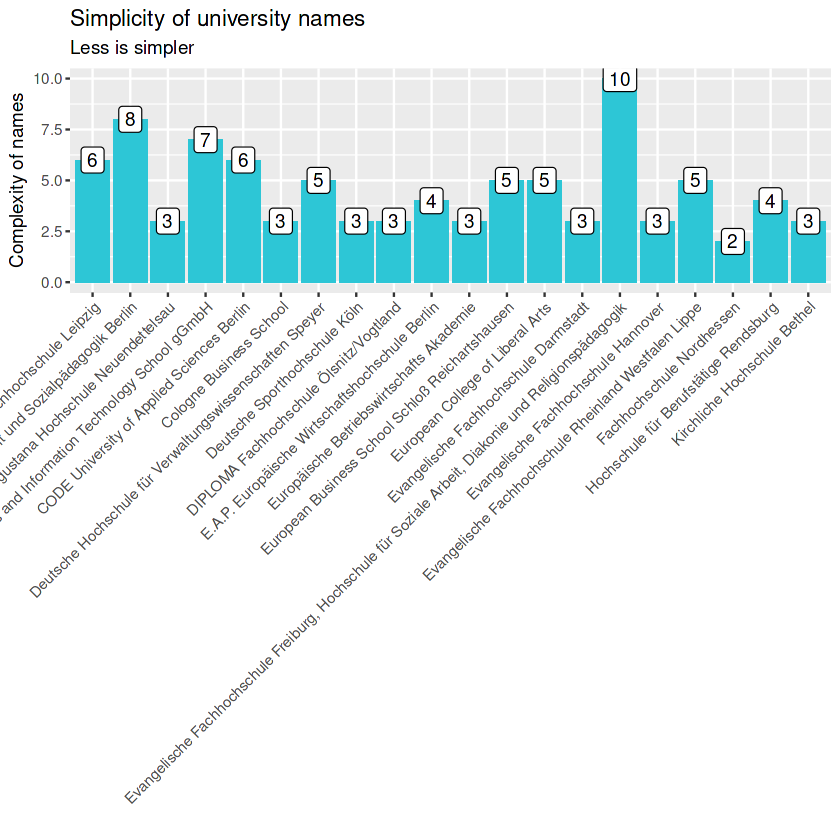

In [66]:
# Step 2 - Visualize
simplicity_of_name %>%

    # Setup canvas with the columns year (x-axis) and sales (y-axis)
    ggplot(aes(x = name, y = simple_name)) +

    # Geometries
    geom_col(fill = "#2DC6D6") + # Use geom_col for a bar plot
    geom_label(aes(label = simple_name)) + # Adding labels to the bars

    # Formatting
    # scale_y_continuous(labels = scales::dollar) + # Change the y-axis. 
    # Again, we have to adjust it for euro values
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +

    labs(
        title    = "Simplicity of university names",
        subtitle = "Less is simpler",
        x = "", # Override defaults for x and y
        y = "Complexity of names"
    )

# Challenge 2
1. Scrape 1 canyon's competitor: https://www.rosebikes.de/ or https://www.radon-bikes.de
1. create a small database:
    1. model names
    1. prices for at least 1 category
1. Tip: use selectorgadget to understand website structures
1. convert to readable format
1. prices should be numeric format (without any other letters or symbols)
1. check if prices are reasonable

In [67]:
url_mtb = "https://www.rosebikes.com/bikes/mtb"
html_mtb = url_mtb %>% 
          read_html()
html_mtb

{html_document}
<html data-trbo-id="trbo_12808_386e75dfe72ecec7b1fd8436f4fc8f2c" class="no-js " lang="en">
[1] <head>\n<meta http-equiv="Content-Type" content="text/html; charset=UTF-8 ...
[2] <body class=" body--white row-padding-mobile-200">\n                      ...

In [68]:
name_tbl = html_mtb %>% 
            html_nodes("h4.basic-headline__title") %>% 
            html_text() #%>% 
            # Extrag all digits between " " and ".\n" The "\" have to be escaped
            # You can use Look ahead "<=" and Look behind "?=" for this
            #stringr::str_extract("(?<= )[0-9]*(?=\\.\\n)")%>% 
            # Make all values numeric
            #as.numeric()
category_bike = html_mtb %>% html_nodes("h1.basic-headline__title") %>% html_text()
name_tbl

[1] "COUNT SOLO"     "PSYCHO PATH"    "THRILL HILL"    "GROUND CONTROL"
[5] "ROOT MILLER"    "BONERO"         "SOUL FIRE"      "THE BRUCE"

In [69]:
tibble(name_tbl, category_bike)

name_tbl,category_bike
<chr>,<chr>
COUNT SOLO,MTB
PSYCHO PATH,MTB
THRILL HILL,MTB
GROUND CONTROL,MTB
ROOT MILLER,MTB
BONERO,MTB
SOUL FIRE,MTB
THE BRUCE,MTB


In [70]:
price_tbl = html_mtb %>% 
            html_nodes(".catalog-category-bikes__price") %>% 
            html_text() %>% 
            # Extrag all digits between " " and ".\n" The "\" have to be escaped
            # You can use Look ahead "<=" and Look behind "?=" for this
            #stringr::str_extract("from €([0-9,]+)\\.") %>%
            #stringr::str_remove("from €|,") %>%
            stringr::str_remove_all("[^0-9.]") %>%
            # Make all values numeric
            as.numeric()

tibble(price_tbl)

price_tbl
<dbl>
749
1499
2999
1999
2299
1499
2599
899


In [71]:
final_tbl = dplyr::bind_cols(tibble(category_bike), tibble(name_tbl), tibble(price_tbl))
kable(final_tbl)



|category_bike |name_tbl       | price_tbl|
|:-------------|:--------------|---------:|
|MTB           |COUNT SOLO     |       749|
|MTB           |PSYCHO PATH    |      1499|
|MTB           |THRILL HILL    |      2999|
|MTB           |GROUND CONTROL |      1999|
|MTB           |ROOT MILLER    |      2299|
|MTB           |BONERO         |      1499|
|MTB           |SOUL FIRE      |      2599|
|MTB           |THE BRUCE      |       899|